# AR Line Diagnostics

Here, we assess the SNR in a number of flare lines for classes M1 and above

In [1]:
import asdf
from astropy.coordinates import SkyCoord
import astropy.table
import astropy.units as u
from astropy.visualization import quantity_support
from astropy.wcs.utils import wcs_to_celestial_frame
import fiasco
import matplotlib.pyplot as plt
import ndcube
import numpy as np
from scipy.interpolate import interp1d
from sunpy.coordinates import get_earth

from mocksipipeline.modeling import convolve_with_response, _blur_spectra
from mocksipipeline.instrument.configuration import moxsi_slot_spectrogram_pinhole, moxsi_slot

In [2]:
def annotate_lines(axis, line_list, flux, color, unit=None, rtol=0.1):
    wavelength = flux.axis_world_coords(0)[0]
    data = flux.to(flux.unit if unit is None else unit).data
    for row in line_list:
        i_x = flux.wcs.world_to_array_index(u.Quantity([row['wavelength']]))
        if data[i_x] / data.max() < rtol:
            continue
        axis.annotate(
            f'{row["ion name"]}, {row["wavelength"].to_string(format="latex_inline", precision=5)}',
            (wavelength[i_x].to_value(), data[i_x]),
            xytext=(0, 150),
            textcoords='offset points',
            rotation=90,
            color=color,
            horizontalalignment='center',
            verticalalignment='center',
            arrowprops=dict(color=color, arrowstyle='-', ls='--'),
        )

## Creating an active region line list

Load the line list and estimate the MOXSI flux from the CHIANTI intensities

In [2]:
channel_o1 = moxsi_slot_spectrogram_pinhole.channel_list[12]

In [3]:
channel_o1

MOXSI Detector Channel--spectrogram_pinhole
-----------------------------------
Spectral order: 1
Filter: Al+Al2O3, 150.000 nm
Detector dimensions: (1504, 2000)
Wavelength range: [0.0 Angstrom, 83.61862217082933 Angstrom]
Spectral plate scale: 0.07179487179487179 Angstrom / pix
Spatial plate scale: [7.40437766 7.40437766] arcsec / pix
Reference pixel: [1000.  752.    0.] pix
aperture: Circular Aperture
-------------------------
diameter: 44.0 micron
area: 1.5205308443374597e-05 cm2


In [4]:
earth_obs = get_earth('2020-01-01')
hpc_frame = wcs_to_celestial_frame(channel_o1.get_wcs(earth_obs))
source_loc = SkyCoord(Tx=0*u.arcsec, Ty=0*u.arcsec, frame=hpc_frame)

  'angstrom' -> 'Angstrom'. [astropy.wcs.wcs]


First, load the line list and convert intensities to units of the MOXSI detector. Note that we can carry out a similar process for the AR case using the AR intensity and the lower energy flare classes.

In [5]:
full_line_list = astropy.table.QTable.read('../data/line_lists/full-line-list.asdf')
full_line_list = full_line_list[['ion name',
                                 'wavelength',
                                 'max temperature_flare_ext',
                                 'intensity (coronal)_flare_ext',
                                 'intensity (coronal)_active_region']]
full_line_list['energy'] = full_line_list['wavelength'].to('keV', equivalencies=u.spectral())
# Convert intensities to instrument units
f_ea_interp = interp1d(channel_o1.wavelength.to_value('AA'), channel_o1.effective_area.to_value('cm2'),)
ea_interp = f_ea_interp(full_line_list['wavelength'].to_value('AA')) * u.cm**2
full_line_list['intensity (coronal)_flare_ext'] = (full_line_list['intensity (coronal)_flare_ext'] * ea_interp * channel_o1.pixel_solid_angle)
full_line_list.rename_column('intensity (coronal)_flare_ext', r'flare\_ext')
full_line_list['intensity (coronal)_active_region'] = (full_line_list['intensity (coronal)_active_region'] * ea_interp * channel_o1.pixel_solid_angle).to('ph/pix/h')
full_line_list.rename_column('intensity (coronal)_active_region', r'active\_region')
# Add approximate formation temperature
temperature_grid = 10**np.arange(5.5,7.5,0.05)*u.K
all_chianti_ions = [fiasco.Ion(i, temperature_grid) for i in fiasco.list_ions(fiasco.defaults['hdf5_dbase_root'])]
ioneq_tmax = {i.ion_name_roman: i.formation_temperature for i in all_chianti_ions}
full_line_list['$T_{max}$'] = list(map(lambda x: ioneq_tmax[x].to('MK'), full_line_list['ion name']))
# Add FIP information
all_chianti_elements = [fiasco.Element(el, 1*u.MK) for el in fiasco.list_elements(fiasco.defaults['hdf5_dbase_root'])]
element_fip = {el.atomic_symbol: el[0].ip for el in all_chianti_elements}
full_line_list['IP'] = list(map(lambda x: element_fip[x.split()[0]].to('eV'), full_line_list['ion name']))
full_line_list['FIP'] = list(map(lambda x: 'low' if x<=10*u.eV else 'high', full_line_list['IP']))
# Add information about which moxsi pixel corresponds to which wavelength
full_line_list['MOXSI pixel'] = channel_o1.get_wcs(earth_obs).world_to_array_index(source_loc, full_line_list['wavelength'])[-1]
# Reorder columns
full_line_list = full_line_list[[
    'ion name',
    'wavelength',
    'energy',
    'MOXSI pixel',
    '$T_{max}$',
    'IP',
    'FIP',
    #r'flare\_ext',
    r'active\_region'
]]
full_line_list.sort(keys='wavelength')

/Users/wtbarnes/mambaforge/envs/mocksipipeline-dev/lib/python3.11/site-packages/astropy/units/equivalencies.py:141: RuntimeWarning: divide by zero encountered in divide
  (si.m, si.J, lambda x: hc / x),
/Users/wtbarnes/mambaforge/envs/mocksipipeline-dev/lib/python3.11/site-packages/xrt/backends/raycing/materials.py:253: UserWarning: Reading `.npy` or `.npz` file required additional header parsing as it was created on Python 2. Save the file again to speed up loading and avoid this warning.
  ef1f2 = (np.array(res[self.name+'_E']),
/Users/wtbarnes/mambaforge/envs/mocksipipeline-dev/lib/python3.11/site-packages/xrt/backends/raycing/materials.py:254: UserWarning: Reading `.npy` or `.npz` file required additional header parsing as it was created on Python 2. Save the file again to speed up loading and avoid this warning.
  np.array(res[self.name+'_f1']),
/Users/wtbarnes/mambaforge/envs/mocksipipeline-dev/lib/python3.11/site-packages/xrt/backends/raycing/materials.py:255: UserWarning: Readi

We want to avoid cases where we include lines that are actually weak, but get grouped into the same pixel as strong lines and thus appear as if they're just as strong. Thus, we'll group by MOXSI pixel and if a particular line is significantly below that line in that pixel, then we drop that line

In [6]:
max_threshold = 0.05
group_tables = []
for group in full_line_list.group_by('MOXSI pixel').groups:
    group_tables.append(group[group['active\\_region'] >= group['active\\_region'].max() * max_threshold])
full_line_list = astropy.table.vstack(group_tables)

Then, load the reference flare spectra

In [7]:
goes_class = ['a1', 'b1', 'b7']
flare_spectra = []
with asdf.open('../data/reference_spectra/caspi_flare_spectra.asdf', copy_arrays=True) as af:
    for gc in goes_class:
        flare_spectra.append((gc, ndcube.NDCube(af.tree[gc]['data'], wcs=af.tree[gc]['wcs'])))
flare_spectra = ndcube.NDCollection(flare_spectra, aligned_axes=(0,))

Now, compute the MOXSI counts for a source location at disk center as a function of pixel

First, let's just look at the flux in each line in first order

In [8]:
flux_columns = {}
for gc in goes_class:
    flux = convolve_with_response(flare_spectra[gc], channel_o1, include_gain=False)
    #flux = _blur_spectra(flux, blur / channel_o1.spatial_plate_scale[0] * channel_o1.spectral_plate_scale, channel_o1)
    #indices = flux.wcs.world_to_array_index(full_line_list['wavelength'])
    # NOTE: Calling w2ai on an array when the WCS is 1D reverses the order of the returned indices (!!!)
    #indices = np.array(indices)[::-1]
    f_interp = interp1d(flux.axis_world_coords(0)[0].to_value('AA'), flux.data, kind='nearest')
    flux_columns[gc.capitalize()] = (f_interp(full_line_list['wavelength'].to_value('AA'))*flux.unit).to('ph/pix/h')
flare_snr_table = astropy.table.QTable(flux_columns)
flare_snr_table = astropy.table.hstack([full_line_list,flare_snr_table])
flare_snr_table.sort(keys='wavelength')

/Users/wtbarnes/mambaforge/envs/mocksipipeline-dev/lib/python3.11/site-packages/astropy/units/equivalencies.py:141: RuntimeWarning: divide by zero encountered in divide
  (si.m, si.J, lambda x: hc / x),
/Users/wtbarnes/mambaforge/envs/mocksipipeline-dev/lib/python3.11/site-packages/xrt/backends/raycing/materials.py:253: UserWarning: Reading `.npy` or `.npz` file required additional header parsing as it was created on Python 2. Save the file again to speed up loading and avoid this warning.
  ef1f2 = (np.array(res[self.name+'_E']),
/Users/wtbarnes/mambaforge/envs/mocksipipeline-dev/lib/python3.11/site-packages/xrt/backends/raycing/materials.py:254: UserWarning: Reading `.npy` or `.npz` file required additional header parsing as it was created on Python 2. Save the file again to speed up loading and avoid this warning.
  np.array(res[self.name+'_f1']),
/Users/wtbarnes/mambaforge/envs/mocksipipeline-dev/lib/python3.11/site-packages/xrt/backends/raycing/materials.py:255: UserWarning: Readi

The next thing we need to do is make a cut in SNR to eliminate those lines we don't have a chance of seeing. We require that this threshold be met at the M1 level and above

In [9]:
threshold = 10 * u.photon / u.pix / u.h

In [10]:
flare_snr_table = flare_snr_table[flare_snr_table['A1'] > threshold]

In [11]:
flare_snr_table

ion name,wavelength,energy,MOXSI pixel,$T_{max}$,IP,FIP,active\_region,A1,B1,B7
,Angstrom,keV,,MK,eV,,ph / (h pix),ph / (h pix),ph / (h pix),ph / (h pix)
str9,float64,float64,int64,float64,float64,str4,float64,float64,float64,float64
Fe XVII,12.124099731445312,1.022626019081914,1169,3.9810717055349367,7.902380855536887,low,0.5317065642790317,18.612761747426475,267.01141249068655,910.8492260976917
Ne X,12.132100105285645,1.0219516601184613,1169,4.466835921509589,21.564534438226993,high,0.2176106028044265,18.612761747426475,267.01141249068655,910.8492260976917
Ne X,12.137499809265137,1.0214970165318327,1169,4.466835921509589,21.564534438226993,high,0.10885462955509984,18.612761747426475,267.01141249068655,910.8492260976917
Fe XVII,13.824999809265137,0.8968115742765466,1193,3.9810717055349367,7.902380855536887,low,0.3297770041105953,16.617514165934683,199.2216291411952,476.5823134411467
Fe XVII,15.012999534606934,0.825845615643965,1209,3.9810717055349367,7.902380855536887,low,3.5111654088694446,129.48264430741062,1511.7083459539426,3538.040022428126
Fe XVI,15.109199523925781,0.8205874721348957,1210,2.818382931264432,7.902380855536887,low,0.08975015498576981,23.48942084430236,175.50570990092385,538.8304616269835
O VIII,15.175999641418457,0.8169754965914837,1211,2.238721138568324,13.61805488299139,high,0.0726746250269903,15.037558604811256,93.14490934834743,677.3175485399674
O VIII,15.17650032043457,0.8169485442322979,1211,2.238721138568324,13.61805488299139,high,0.03631655137017399,15.037558604811256,93.14490934834743,677.3175485399674


Finally, now that we've really pared down the table, let's compute a $T_{max}$ based on the contribution function

In [12]:
contribution_functions = {}
for ion_name in np.unique(flare_snr_table['ion name']):
    ion = fiasco.Ion(ion_name, temperature_grid)
    #density = 1e15*u.K/(u.cm**3)/ion.temperature
    density = 1e10 * u.cm**(-3)
    goft = ion.contribution_function(density, couple_density_to_temperature=False)
    transitions = ion.transitions.wavelength[~ion.transitions.is_twophoton]
    contribution_functions[ion_name] = (transitions, goft)
goft_col = []
for row in flare_snr_table:
    _t, _g = contribution_functions[row['ion name']]
    idx = np.argmin(np.abs(_t - row['wavelength']))
    goft_col.append(_g[:,0,idx])
flare_snr_table['$T_{max,G}$'] = list(map(lambda x: temperature_grid[np.argmax(x)].to('MK'), goft_col))

One last reordering of the columns

In [13]:
flare_snr_table = flare_snr_table[[
    'ion name',
    'wavelength',
    'energy',
    'MOXSI pixel',
    '$T_{max}$',
    '$T_{max,G}$',
    'IP',
    'FIP',
    r'active\_region',
    'A1',
    'B1',
    'B7',
]]
flare_snr_table.sort(keys='wavelength')

In [14]:
flare_snr_table

ion name,wavelength,energy,MOXSI pixel,$T_{max}$,"$T_{max,G}$",IP,FIP,active\_region,A1,B1,B7
,Angstrom,keV,,MK,MK,eV,,ph / (h pix),ph / (h pix),ph / (h pix),ph / (h pix)
str9,float64,float64,int64,float64,float64,float64,str4,float64,float64,float64,float64
Fe XVII,12.124099731445312,1.022626019081914,1169,3.9810717055349367,6.309573444801865,7.902380855536887,low,0.5317065642790317,18.612761747426475,267.01141249068655,910.8492260976917
Ne X,12.132100105285645,1.0219516601184613,1169,4.466835921509589,5.623413251903433,21.564534438226993,high,0.2176106028044265,18.612761747426475,267.01141249068655,910.8492260976917
Ne X,12.137499809265137,1.0214970165318327,1169,4.466835921509589,5.623413251903433,21.564534438226993,high,0.10885462955509984,18.612761747426475,267.01141249068655,910.8492260976917
Fe XVII,13.824999809265137,0.8968115742765466,1193,3.9810717055349367,6.309573444801865,7.902380855536887,low,0.3297770041105953,16.617514165934683,199.2216291411952,476.5823134411467
Fe XVII,15.012999534606934,0.825845615643965,1209,3.9810717055349367,5.623413251903433,7.902380855536887,low,3.5111654088694446,129.48264430741062,1511.7083459539426,3538.040022428126
Fe XVI,15.109199523925781,0.8205874721348957,1210,2.818382931264432,3.9810717055349367,7.902380855536887,low,0.08975015498576981,23.48942084430236,175.50570990092385,538.8304616269835
O VIII,15.175999641418457,0.8169754965914837,1211,2.238721138568324,3.1622776601683533,13.61805488299139,high,0.0726746250269903,15.037558604811256,93.14490934834743,677.3175485399674
O VIII,15.17650032043457,0.8169485442322979,1211,2.238721138568324,3.1622776601683533,13.61805488299139,high,0.03631655137017399,15.037558604811256,93.14490934834743,677.3175485399674


Write out AR line table to a file

In [15]:
flare_snr_table.write('../data/line_lists/active-region-line-table.asdf')

## Assessing Relationship between formation temperature and IP

Plot ionization potential versus formation temperature

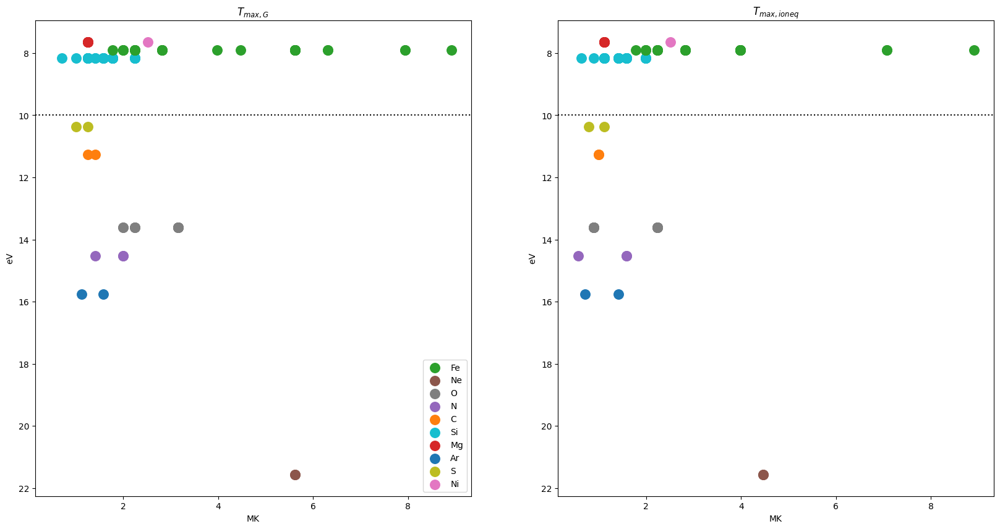

In [29]:
el_colors = {el: f'C{i}' for i,el in enumerate(np.unique(list(map(lambda x: x.split()[0], flare_snr_table['ion name']))))}
with quantity_support():
    fig = plt.figure(figsize=(20,10))
    # Contribution function
    ax = fig.add_subplot(121)
    for row in flare_snr_table:
        ax.scatter(row['$T_{max,G}$'], row['IP'],
                   marker='.',
                   s=500,
                   color=el_colors[row['ion name'].split()[0]],
                   #s=row['X5']*1e3,
                   #alpha=0.25,
                   label=row['ion name'].split()[0])
    ax.axhline(y=10*u.eV, color='k', ls=':')
    ax.invert_yaxis()
    handles, labels = ax.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax.legend(by_label.values(), by_label.keys(),loc=4)
    ax.set_title('$T_{max,G}$')
    # Ionization fraction
    ax = fig.add_subplot(122,sharex=ax,sharey=ax)
    for row in flare_snr_table:
        ax.scatter(row['$T_{max}$'], row['IP'],
                   marker='.',
                   s=500,
                   color=el_colors[row['ion name'].split()[0]],
                   #s=row['X5']*1e3,
                   #alpha=0.25,
                   label=row['ion name'].split()[0])
    ax.axhline(y=10*u.eV, color='k', ls=':')
    ax.set_title('$T_{max,ioneq}$')

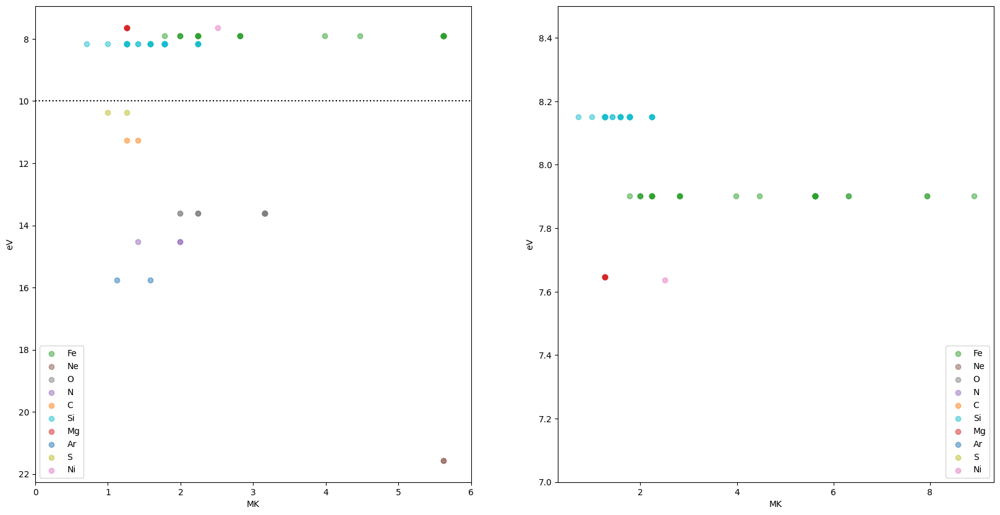

In [31]:
with quantity_support():
    fig = plt.figure(figsize=(20,10))
    # Compare high and low FIP
    ax = fig.add_subplot(121)
    for row in flare_snr_table:
        ax.scatter(row['$T_{max,G}$'], row['IP'],
                   marker='o',
                   color=el_colors[row['ion name'].split()[0]],
                   #s=row['M5']*1e3,
                   alpha=0.5,
                   label=row['ion name'].split()[0])
    ax.axhline(y=10*u.eV, color='k', ls=':')
    handles, labels = ax.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax.legend(by_label.values(), by_label.keys(), loc=3)
    ax.set_xlim(0,6)
    ax.invert_yaxis()
    # Compare temperature coverage
    ax = fig.add_subplot(122)
    for row in flare_snr_table:
        ax.scatter(row['$T_{max,G}$'], row['IP'],
                   marker='o',
                   color=el_colors[row['ion name'].split()[0]],
                   #s=row['M5']*1e3,
                   alpha=0.5,
                   label=row['ion name'].split()[0])
    ax.axhline(y=10*u.eV, color='k', ls=':')
    handles, labels = ax.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax.legend(by_label.values(), by_label.keys(), loc=4)
    ax.set_ylim(7,8.5)

## Assessing $G(T)$ ratio for High and Low FIP Pairs

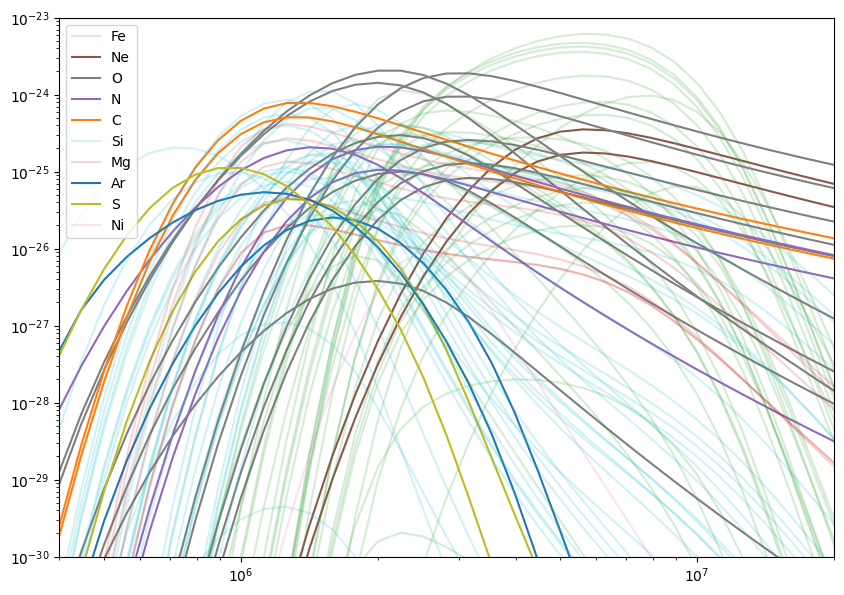

In [32]:
fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot()
for goft,ion_name,fip in zip(goft_col, flare_snr_table['ion name'], flare_snr_table['FIP']):
    ax.plot(temperature_grid, goft, color=el_colors[ion_name.split()[0]], alpha=0.2 if fip=='low' else 1.0, label=ion_name.split()[0])
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_ylim(1e-30, 1e-23)
ax.set_xlim(4e5, 2e7)
handles, labels = ax.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax.legend(by_label.values(), by_label.keys())

Maybe take ratios between the contribution functions of the high-FIP elements? Which ones are the most flat across the relevant temperature ranges?

In [40]:
modded_table = flare_snr_table.copy()
modded_table['contribution function'] = goft_col

In [41]:
low_fip_lines = modded_table[modded_table['FIP']=='low']
high_fip_lines = modded_table[modded_table['FIP']=='high']

In [42]:
from cycler import cycler
ls_cycler = cycler(linestyle=['-', '--', ':', '-.', (5, (10, 3))])
el_linestyles = {el: ls for el,ls in zip(np.unique(list(map(lambda x: x.split()[0], low_fip_lines['ion name']))), ls_cycler)}

/var/folders/cr/pj7yk8p976d7ny98bgvlpfyr0000gq/T/ipykernel_76958/2883089586.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(12,6))


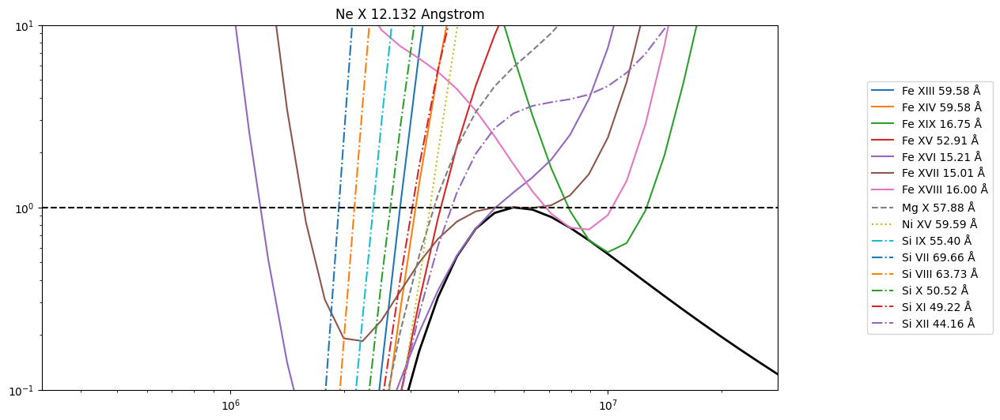

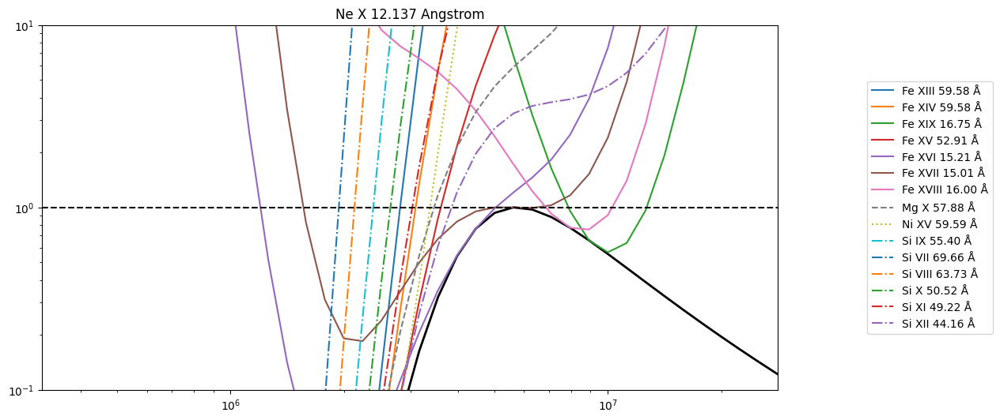

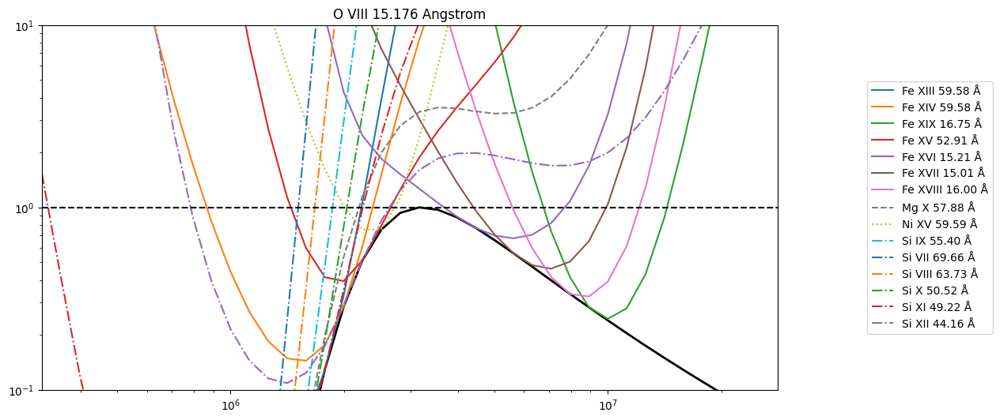

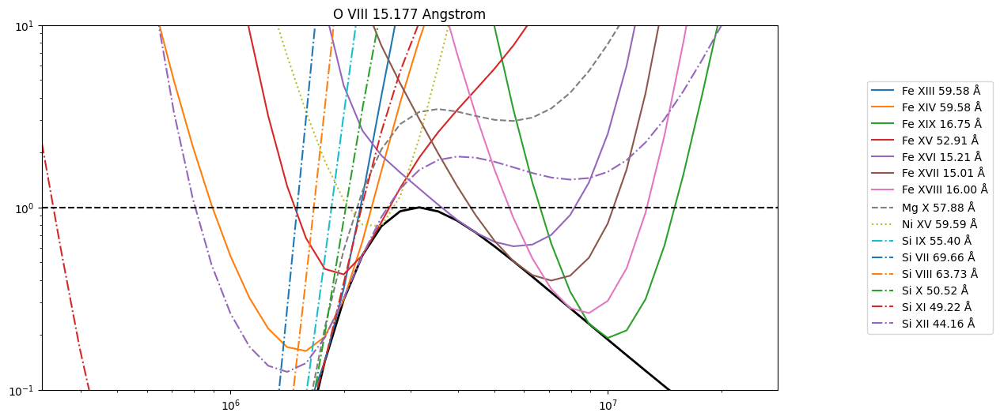

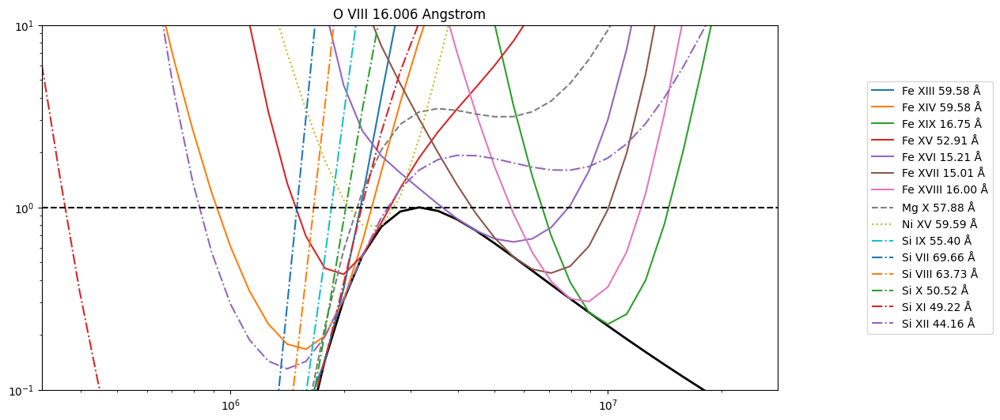

...

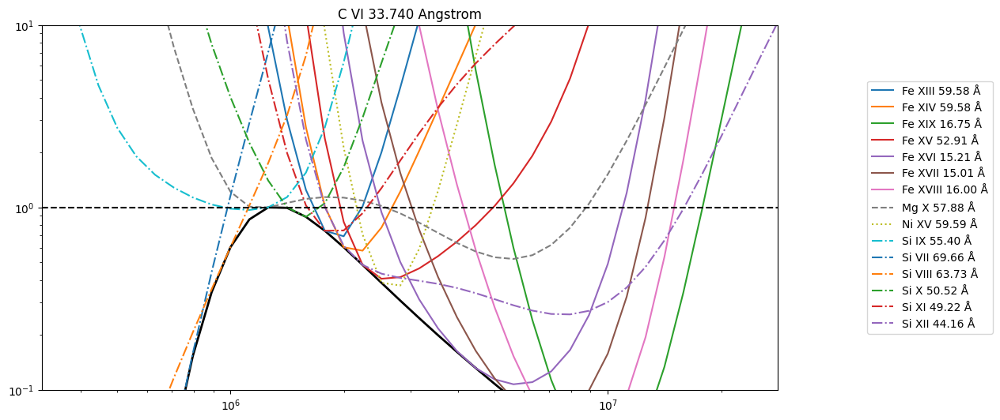

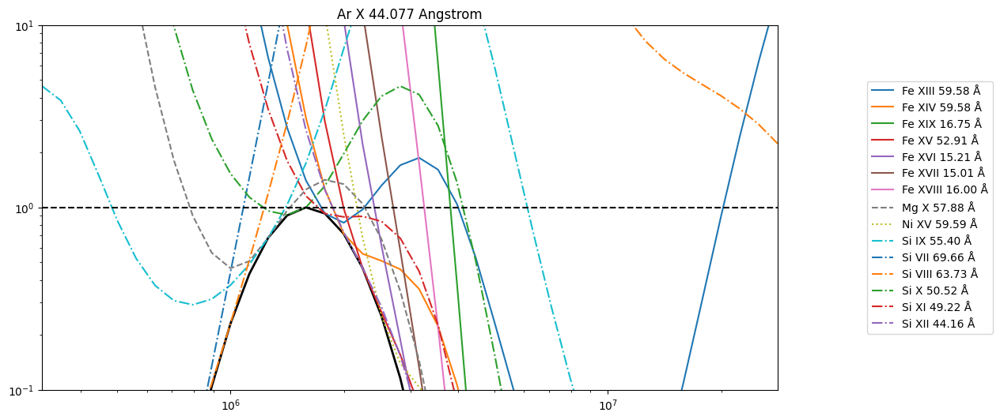

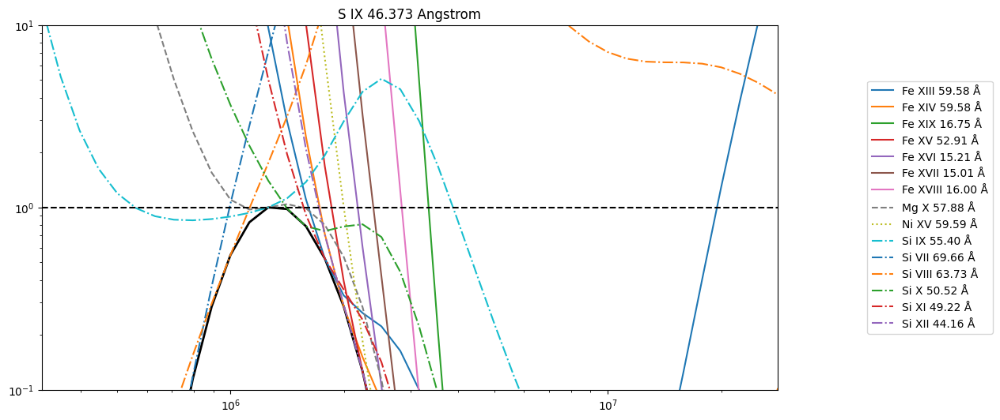

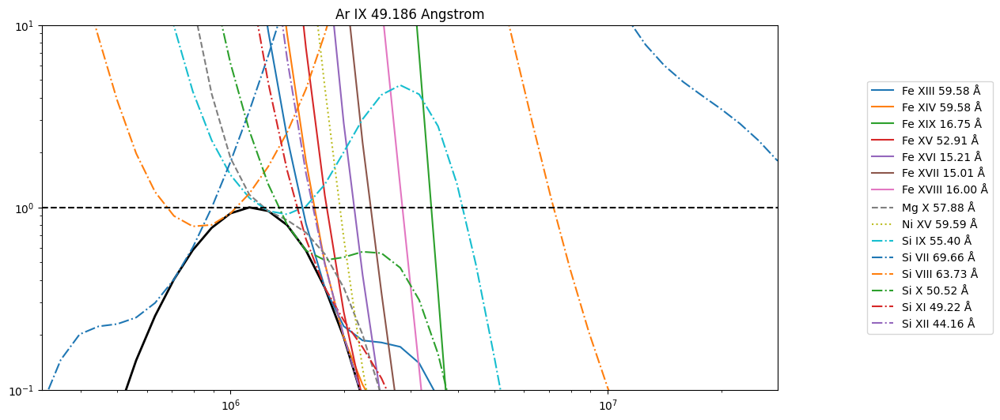

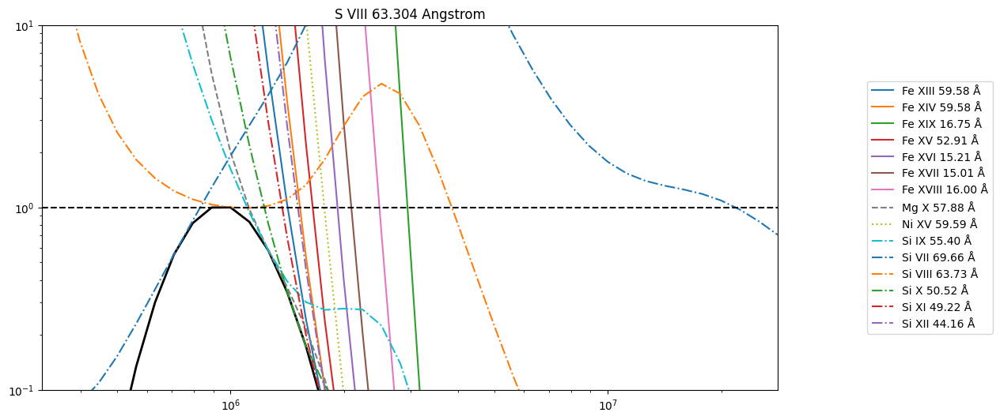

In [46]:
for hf_row in high_fip_lines:#.group_by('ion name').groups:
    #hf_row = tab[np.argsort(tab['flare\_ext'])][-1]
    goft_hf_strongest = hf_row['contribution function']
    goft_hf_strongest /= goft_hf_strongest.max()
    #plt.plot(temperature_grid, goft_hf_strongest, label=hf_row['ion name'])
    fig = plt.figure(figsize=(12,6))
    ax = fig.add_subplot()
    ax.set_title(f"{hf_row['ion name']} {hf_row['wavelength']:.3f}")
    #ax2 = ax.twinx()
    ax.plot(temperature_grid, goft_hf_strongest, color='k', lw=2,)
    for tab_lf in low_fip_lines.group_by('ion name').groups:
        lf_row = tab_lf[np.argsort(tab_lf['active\_region'])][-1]
        goft_lf_strongest = lf_row['contribution function']
        goft_lf_strongest /= goft_lf_strongest.max()
        goft_ratio = goft_hf_strongest/goft_lf_strongest
        ax.plot(temperature_grid, goft_hf_strongest/goft_lf_strongest,
                label=f"{lf_row['ion name']} {lf_row['wavelength'].to_value('Angstrom'):.2f} Å",
                ls=el_linestyles[lf_row['ion name'].split()[0]]['linestyle'])
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.set_ylim(1e-1, 1e1)
    ax.set_xlim(temperature_grid[[0,-1]].value)
    ax.axhline(y=1, ls='--', color='k')
    ax.legend(loc='center right', bbox_to_anchor=(1.3,0.5))

Compute the gradient of this $G(T)$ ratio. Ideally, the ratio approaches 0 near the peak of the contribution function such that there is little temperature sensitivity near where the lines are strongest and thus any differences when taking a ratio are due to changes in abundance.

/var/folders/cr/pj7yk8p976d7ny98bgvlpfyr0000gq/T/ipykernel_76958/3069579893.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(12,6))


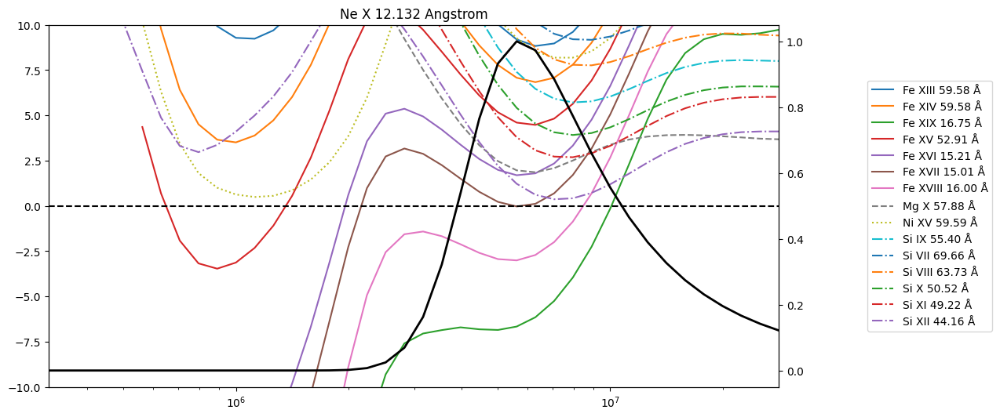

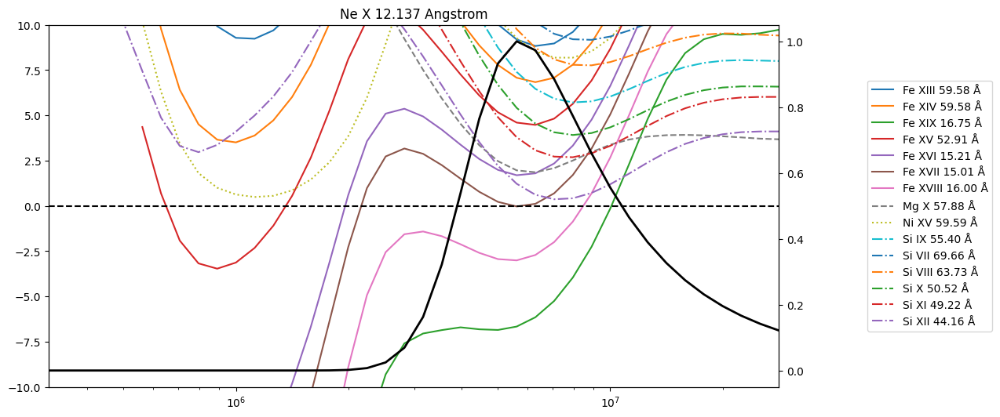

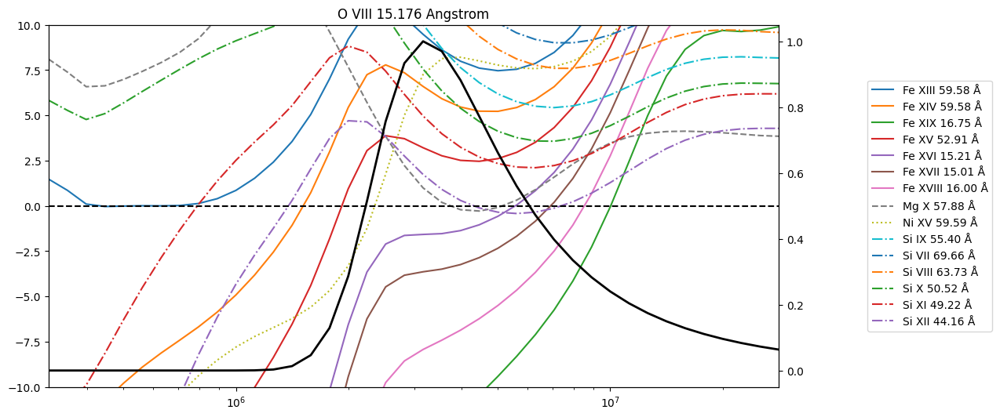

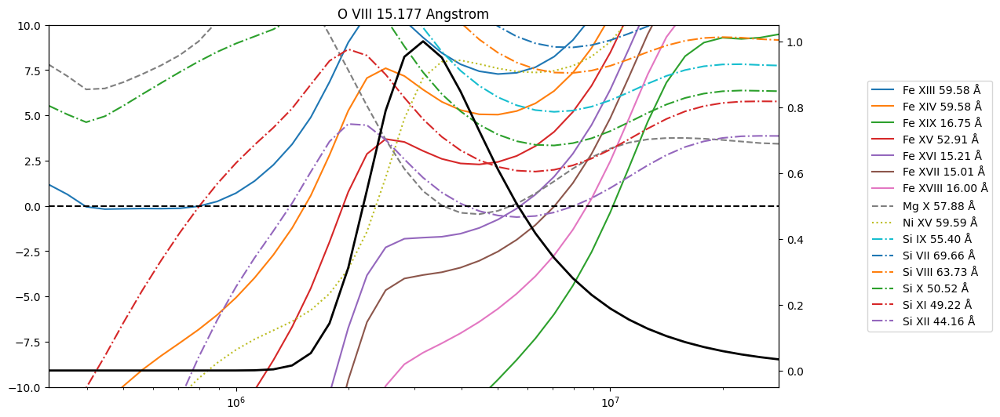

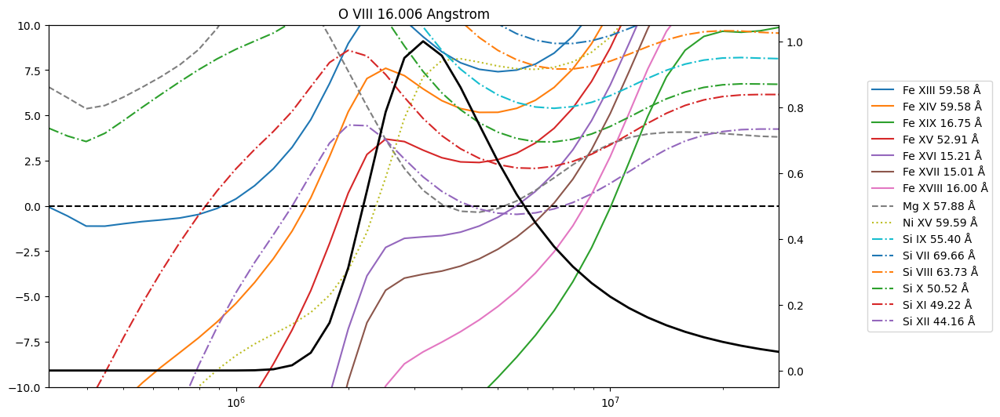

...

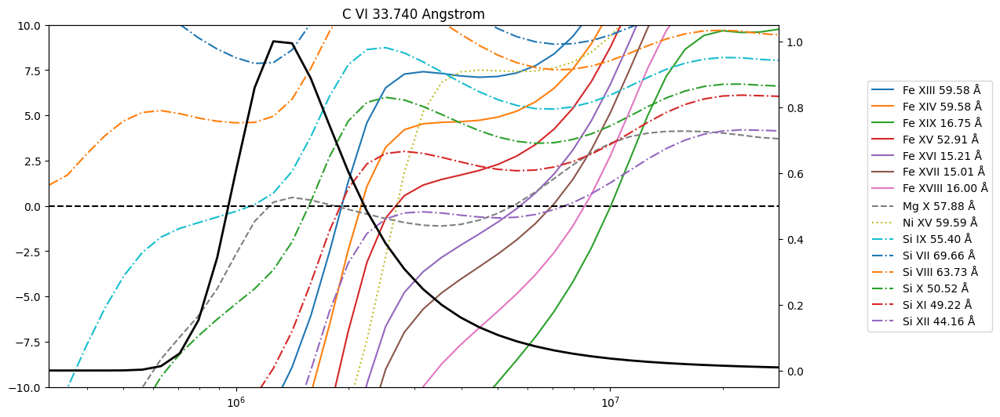

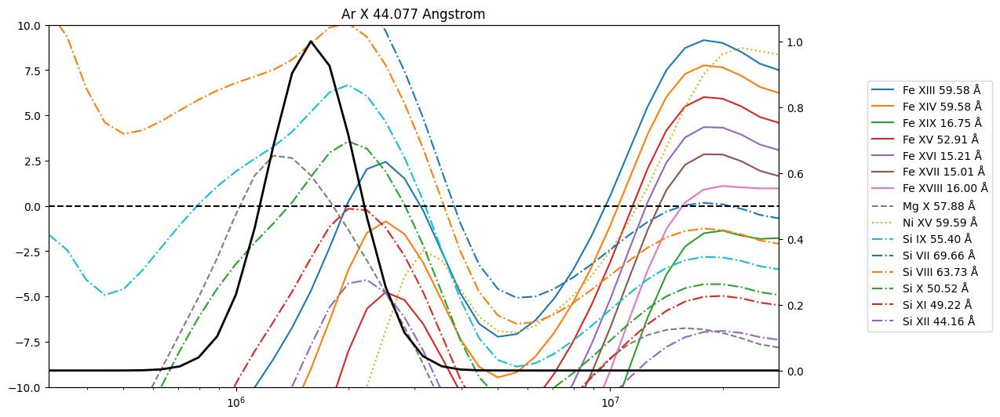

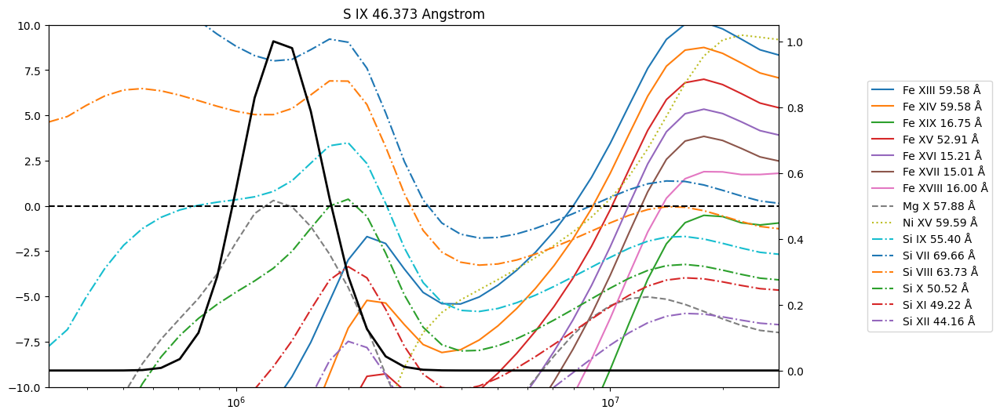

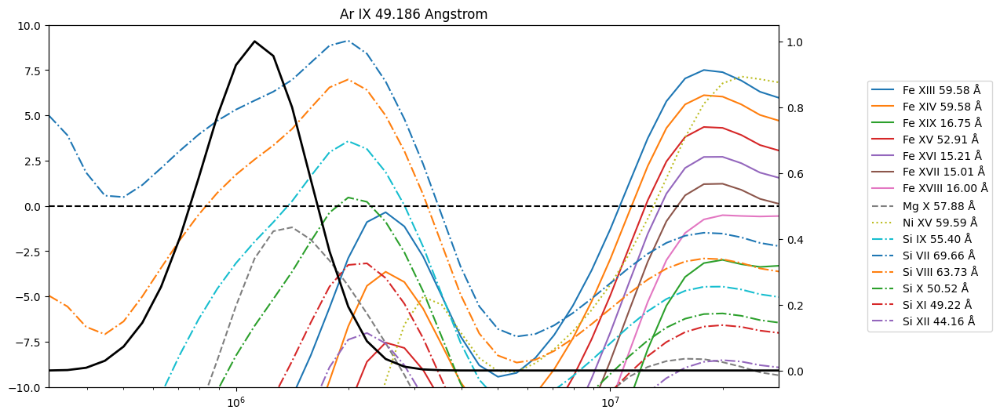

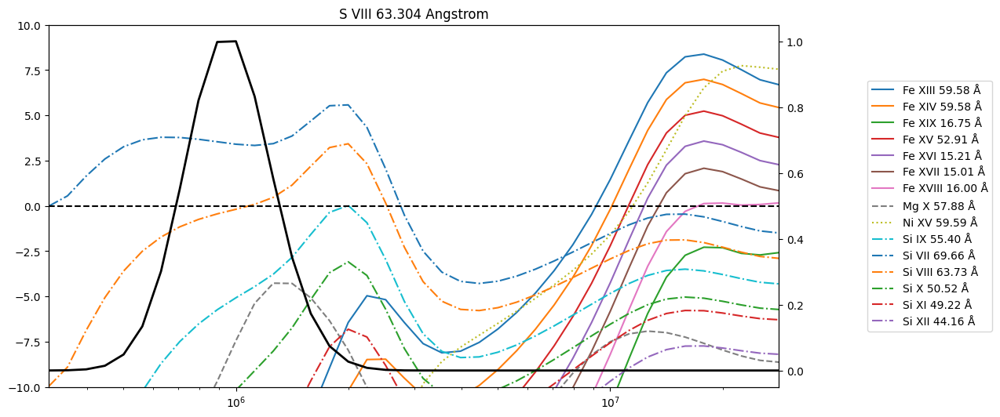

In [44]:
for hf_row in high_fip_lines:#.group_by('ion name').groups:
    #hf_row = tab[np.argsort(tab['flare\_ext'])][-1]
    goft_hf_strongest = hf_row['contribution function']
    goft_hf_strongest /= goft_hf_strongest.max()
    #plt.plot(temperature_grid, goft_hf_strongest, label=hf_row['ion name'])
    fig = plt.figure(figsize=(12,6))
    ax = fig.add_subplot()
    ax.set_title(f"{hf_row['ion name']} {hf_row['wavelength']:.3f}")
    ax2 = ax.twinx()
    ax2.plot(temperature_grid, goft_hf_strongest, color='k', lw=2,)
    for tab_lf in low_fip_lines.group_by('ion name').groups:
        lf_row = tab_lf[np.argsort(tab_lf['active\_region'])][-1]
        goft_lf_strongest = lf_row['contribution function']
        goft_lf_strongest /= goft_lf_strongest.max()
        goft_ratio = goft_hf_strongest/goft_lf_strongest
        ax.plot(temperature_grid, np.gradient(np.log10(goft_ratio), np.log10(temperature_grid.value)),#goft_hf_strongest/goft_lf_strongest,
                label=f"{lf_row['ion name']} {lf_row['wavelength'].to_value('Angstrom'):.2f} Å",
                ls=el_linestyles[lf_row['ion name'].split()[0]]['linestyle'])
    #ax.set_yscale('log')
    ax.set_xscale('log')
    #ax.set_ylim(1e-3, 5)
    ax.set_ylim(-10,10)
    ax.set_xlim(temperature_grid[[0,-1]].value)
    ax.axhline(y=0, ls='--', color='k')
    ax.legend(loc='center right', bbox_to_anchor=(1.3,0.5))

Write the table to a format that enables easier reading. This is messy but is a convenient way to render the table as a nicely formatted PDF.

In [39]:
import sys
import io
with io.StringIO() as _f:
    flare_snr_table.write(_f,
                          format='ascii.aastex',
                          caption=f'Predicted active region line intensities for MOXSI assuming a source is confined to a single pixel located at disk center at the center of the detector. Lines with an A1 intensity below {threshold:latex_inline} are not included. The active\\_region column refers to the CHIANTI active\\_region DEM. These intensities are calculated per line. Lines that share a pixel and have active\\_region below {max_threshold} of the maximum active\\_region in that pixel are also excluded.',
                          #latexdict={'tabletype':'longtable'},
                          formats={
                              'MOXSI pixel': '%d',
                              'wavelength':'%.3f',
                              'energy':'%.3f',
                              '$T_{max}$': '%.1f',
                              '$T_{max,G}$': '%.1f',
                              'IP': '%.1f',
                              r'active\_region': '%.3g',
                              **{k.upper(): '%.3f' for k in goes_class}
                          },
                          overwrite=True)
    table_string = _f.getvalue()
md_file = f"""---
title: "MOXSI Active Region Lines"
author:
- name: Will Barnes
aastexopts: [singlecolumn]
---

\startlongtable
{table_string}
"""
with open('ar-line-table.md', mode='w') as f:
    f.write(md_file)
!pandoc --template aastex63_template.tex ar-line-table.md -o ar-line-table.pdf